# Var-Next - Next frame prediction using variational autoencoders
***
Shantanu Sanyal

Univerisity of Virginia


## Introduction
Introduced by Kingma and Welling in 2013, VAEs offer a powerful framework for learning complex data distributions by introducing stochasticity to the encoding process.  The VAE is an example of a latent variable model; the encoder's task in a VAE is to learn a latent representation of the input images.  This is done by a sampling process where the encoder learns the parameters to a well formulated distribution, and an image's latent representation is simply a sample drawn from that distribution.  For most VAEs, a normal distribution is used due to the ease of sampling.

The latent space itself can be considered a Reimannian manifold which we can traverse.  Many prior works [1, 2](#Refrences) have explored this concept with varying levels of success, but have done so with relatively simple datasets (Celeb, MNIST) that have small feature spaces owing to the small size of the inputs (thumbnail images).  In the following pages I explore whether the concept can generalize to much larger images with substantially more complexity.  In particular, I wanted to explore whether latent space traversal could capture motion interpolation of objects in images.


## The data (part 1)
I opted to construct my own dataset.  I wanted a scenario where the scene of the images was stable, and most of the change in the pixels in the image were attributable to objects in the image moving.  I ended up finding a youtube channel, __[Bob's PA wildlife](https://www.youtube.com/@joeb302)__ which contains many hours of footage of animals moving around on a static game camera facing a log lying across a small stream.  The log seems to attract local wildlife, who use it to cross the water.  While the seasons change, ( and occasionally bears knock over the camera slighly changing its orientation) the video footage is pretty similar from one frame to the next, at least from a statistical standpoint.  The channel contains several compliations of short (Usually just a couple seconds) clips; I downloaded these, cut out undesirable frames and the intro/outro segments in ClipChamp, and dumped the video to 360p images using ffmpeg.  In total after stitching together most of the compilations on the youtube channel and dumping them, I had close to 125,000 frames.  An example image is below:

In [16]:
from matplotlib import pyplot as plt
%matplotlib inline

import numpy as np
import torch
import torchvision
import json
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader


from var_next.vnext import varNext
from var_next.annotation_dataloader import varDataset

Text(0.5, 1.0, 'bear crossing the log')

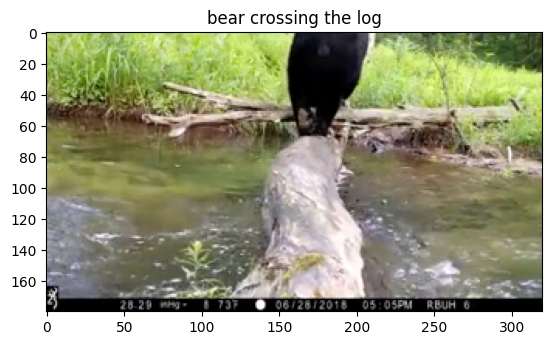

In [3]:
DATA_DIR = '/scratch/ejg8qa/val_images_320'
test = ImageFolder(DATA_DIR,transform=transforms.ToTensor())
val = ImageFolder('/scratch/ejg8qa/log_images_320/val',transform=transforms.ToTensor())
plt.imshow(test[800][0].cpu().squeeze().numpy().transpose(1,2,0))
plt.title("bear crossing the log")

## Variational Autoencoder architecture
### The big idea
Recall that for a normal random variable X, shifting the variable by an amount k simply results in the mean of x being shifted by k.  Also recall that if k is instead a scaling factor, kX results in the parameters of X being scaled to $k\sigma_X$ and $k\mu_X$.  Thus, if we have our VAE learn parameters to a normal distribution $\mathcal{N}(\mu,\sigma)$, we can sample from this distirbution using $\mu + \sigma \mathcal{N}(0, 1)$ without directly drawing from that distribution itself.  This forms the basis for the so called "re-parameterization trick" - since the randomness in our model is coming from a constant $\mathcal{N}(0,1)$ distribution and not directly from the mean and standard deviation parameters we are learning, we can calculate backpropagation and update the weights which are controlling the encoder's output.

This is what makes the VAE tick - the rest of the model is mostly the same as a regular autoencoder.  One additional point which should be discussed is the loss function; in order to force the model to learn the parameters to a normal distribution, an additional loss term is used.  This is the KL divergence between the distribution with the mean and variance the model has learnt and $\mathcal{N}(0,1)$.  Since it is easier and more numerically stable to have the model learn logvariance instead of standard deviation, the KL divergence term ends up being
$$D_{KL}(q(z|x)||p(z)) = \frac{1}{2}\sum 1 + logvar(\sigma) - \mu^2 - e^{logvar(\sigma)}$$

In my code, I let $\sigma$ represent the logvariance vector.

Otherwise the rest of the loss is the same as a regular autoencoder.  I used Mean square error between the input image and the decoded output.

### Design
For this project I opted to build my whole codebase from the ground up as opposed to using preexisting libraries for several reasons.  Firstly, the majority of examples on the internet are for the aforementioned toy models with hard coded sizes; this does me little good to copy since my data is substantially larger.  Second, the more flexible libraries on VAE are unnecessarily complex and difficult to edit, and finally, since this is, after all, an academic exercise I figured I would learn more from the process of building the model myself.

My design centers around json config files, which I have <s>forced</s> persuaded many of my ML colleagues to work with in the past.  Essentially, the json file defines everything about the conv2d/conv2dtranspose nodes in the network (how many layers, the parameters of each node, etc) along with the size of the linear layers and a few other parameters.  The work building this payed off down the road, as it made doing a network architecture search trivial - I can quickly spin up a new config file and launch another version of the network in parallel to see how it does.  After a great deal of tweaking and experimentation, I came up with the final architecure for part 1 is below.

Some key aspects of the network: Firstly, the encoder is larger than the decoder.  I chose this because it is one of the strategies for avoiding posterior collapse - the situation where the model ignores the latent variables and the decoder behaves as though it is just drawing randomly from the same distribution.  Supposedly, having a stronger encoder can help offset this effect.  Though I would have liked to experiment with deeper networks, the size of this network is pretty much the limit for the Rivanna hardware.  To go beyond this size I would have to come up with a way of doing distributed training across several GPUs; this is very close to the largest gradient which can fit on one GPU.  I learned that dropout is not great for CNN networks - things started looking much better when I swapped the dropout nodes for batch normalization.  This is consistent with a lot of other CNN based results from other networks.  I did experiment with a scaling term on the kl divergence (I later found out that this has a name - a Beta VAE) but it seems that having a beta close to 1 produced the best results, even though the loss term from the kl divergence is much less than the MSE loss, it seems that the KLd is just there to keep the parameters in check rather than something that needs to be focused on during training.  Finally, my first set of models had a ReLU activation in the output of the final decoder layer!  Whoops.  Changing this to a sigmoid produced way better looking images (pixel value representation in pytorch is between 0 and 1).  I oped to keep the liner activations in all other layers; it seems to work fine.


A random sample of the models performance is captured below.  We pass a set of images from the validation set through the model and plot the original image along with the reconstruction.

In [57]:
def plot_ae_outputs(model,dataset,n=10,t_idx=[],gs=False):
    plt.figure(figsize=(20,10))
    if not t_idx:
        t_idx = np.random.randint(0,len(dataset),size=n)
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        img = dataset[t_idx[i]][0].unsqueeze(0).to(device)
        #z = encoder(img)
        rec_img  = model(img).detach()
        if gs:
            plt.imshow(img.cpu().squeeze(0).numpy().transpose(1,2,0),cmap='gray')
        else:
            plt.imshow(img.cpu().squeeze().numpy().transpose(1,2,0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title(f'Original Data, {t_idx}')
        ax = plt.subplot(2, n, i + 1 + n)
        if gs:
            plt.imshow(rec_img.cpu().squeeze(0).numpy().transpose(1,2,0),cmap='gray')
        else:
            plt.imshow(rec_img.cpu().squeeze().numpy().transpose(1,2,0))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
    plt.show()


In [5]:
%%capture
cfg_file = "/scratch/ejg8qa/var-Next/configs/4096_d1_latent.json"
WEIGH = "../../vnext_results_sigmoid/4096_d1_latent_beta_1/model_wts.pt"
with open(cfg_file,'r') as jfi:
    cfg = json.load(jfi)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model1 = varNext(cfg,device)
model1.load_state_dict(torch.load(WEIGH))
model1.to(device)
model1.eval()

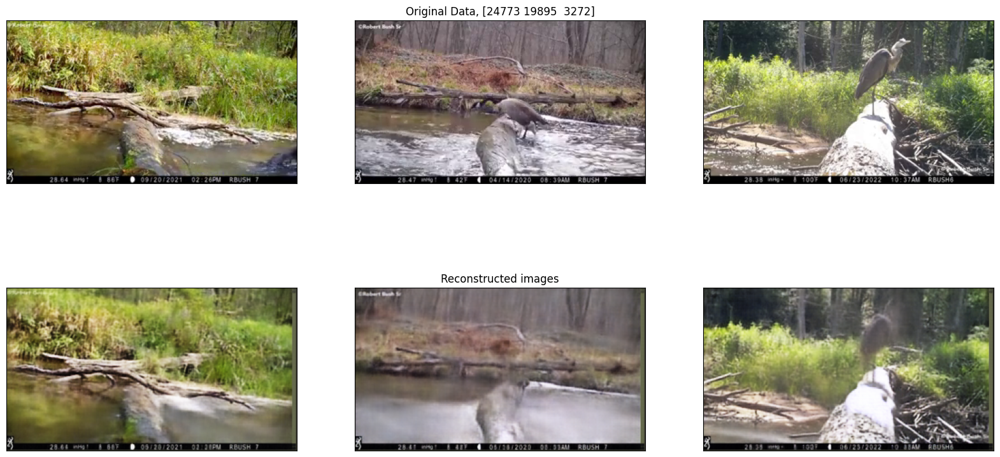

In [20]:
plot_ae_outputs(model1,val,n=3)

As we can see, the scene reconstruction looks great!  Unfortunately the network has a tough time with the animals, which are the real targets of this project.  To rectify this, our test set which I will use for motion interpolation has a clip of large bears which the model can't ignore:

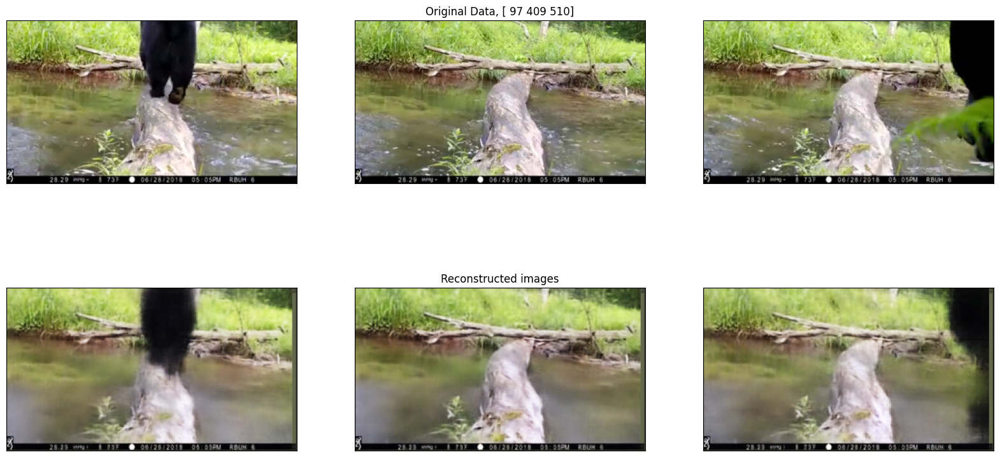

In [9]:
plot_ae_outputs(model1,test,n=3)

## Interpolation
The aforementioned papers which I referenced found that the latent space of the VAE is mostly flat, so to start with I will just try finding the linear direction between two images, and adding this vector to the second to try and predict the latent vector of a "future" image in the video.

Text(0.5, 1.0, 'True frame 40')

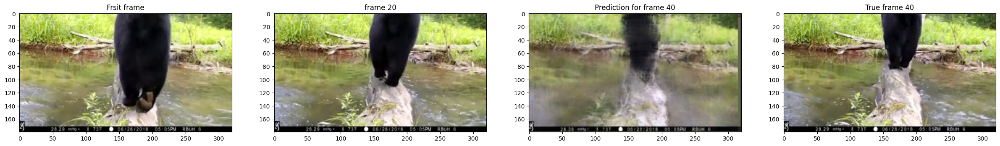

In [11]:
img1 = test[60][0].unsqueeze(0).to(device)
img2 = test[80][0].unsqueeze(0).to(device)
img3 = test[100][0].unsqueeze(0).to(device)

with torch.no_grad():
    enc1 = model1.bottleneck(*model1.encode(img1))
    enc2 = model1.bottleneck(*model1.encode(img2))

    linear_res = enc2 + (enc2-enc1)
    img3_hat = model1.decode(linear_res)

f, ax = plt.subplots(1,4,figsize=(15,10))
f.set_size_inches((30,20))
ax[0].imshow(img1.cpu().squeeze().numpy().transpose(1,2,0))
ax[0].set_title('Frsit frame')
ax[1].imshow(img2.cpu().squeeze().numpy().transpose(1,2,0))
ax[1].set_title('frame 20')
ax[2].imshow(img3_hat.cpu().squeeze().numpy().transpose(1,2,0))
ax[2].set_title('Prediction for frame 40')
ax[3].imshow(img3.cpu().squeeze().numpy().transpose(1,2,0))
ax[3].set_title('True frame 40')

All things considered, I'd call this a success.  It seems that linear traversal in this space does produce a reasonable result.  Let's see if we can do better.

## The data (part 2)
In my mind, the first thing to attempt to fix is that the network does a poor job with the animals.  Perhaps our ability to interpolate would be better if we forced the network to focus on the animals during reconstruction, thus improving their visibility.  To do this, we need annotations.

I threw together a manual annotation tool in openCV.  Since there was no way I was going to hand annotate 125k frames, I added some basic object tracking functionality to autotrack the animals after drawing the initial box.  in order to ensure that I accurately captured the animals after a scene change, I have a hard coded box over the timestamp at the bottom of the image, and when my script detects significant change, it automatically prompts the user to redo the tracking bounding box.  The script dumps the bounding box information to csv.  A screenshot of the tool is below:

The tool can be found in the git repo for the project under video_segment.py

## Training part 2
Now that we have the annotations, I had to write a custom dataloader to use them.  The dataloader uses the filename of the image it is loading to lookp the bounding box information for that frame, and creates a mask for the image.  This mask is zeros everywhere except for within the bounds of the box and is the only way I could come up with fetching the data in the bounding box while keeping the code vectorized (Took me a while to figure this out).  Some detail on this process is in the [appendix](#Fetching-a-subsection-of-an-image).  My new loss function is $$ L = MSE(X,\hat{X}) + KLD + \lambda MSE(X*mask,\hat{X}*mask)$$

Where lambda is a scale factor which compensates for variation in the size and shape of the annotation boxes.  The output of the annotation-trained network is below:


In [64]:
%%capture
cfg_file = "/scratch/ejg8qa/var-Next/configs/4096b2_d1_latent.json"
WEIGH = "../../vnext_results_annot/4096b2_d1_latent_beta_2/model_wts.pt"
with open(cfg_file,'r') as jfi:
    cfg = json.load(jfi)
model2 = varNext(cfg,device)
model2.load_state_dict(torch.load(WEIGH))
model2.to(device)
model2.eval()


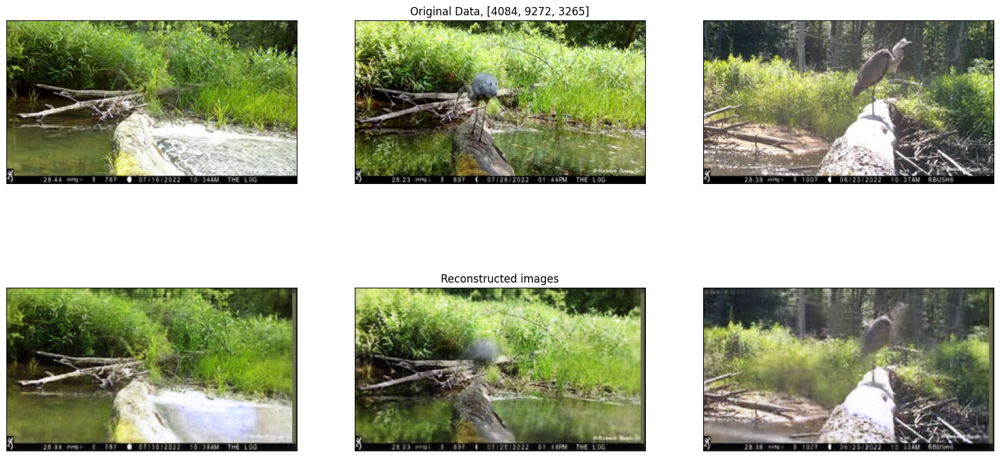

In [15]:
comp = [4084, 9272, 3265]
plot_ae_outputs(model2,val,n=3,t_idx=comp)

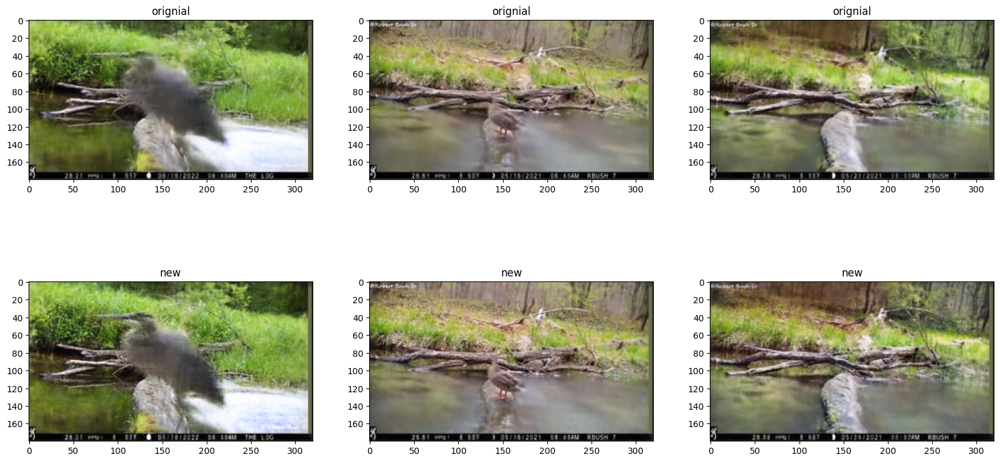

In [35]:
plt.figure(figsize=(20,10))
comp = np.random.randint(0,10000,3)
for i, c in enumerate(comp):
    ax = plt.subplot(2,3,i+1)
    x = val[c][0].unsqueeze(0).to(device)
    with torch.no_grad():
        orig = model1(x)
        new = model2(x)
    ax.imshow(orig.cpu().squeeze().numpy().transpose(1,2,0))
    ax.set_title('orignial')
    ax = plt.subplot(2,3,i+4)
    ax.imshow(new.cpu().squeeze().numpy().transpose(1,2,0))
    ax.set_title('new')
    

Playing around - it looks like birds improve slightly but there isn't a whole lot of change in other animals.  Let's try interpolation

Text(0.5, 1.0, 'New prediction frame 40')

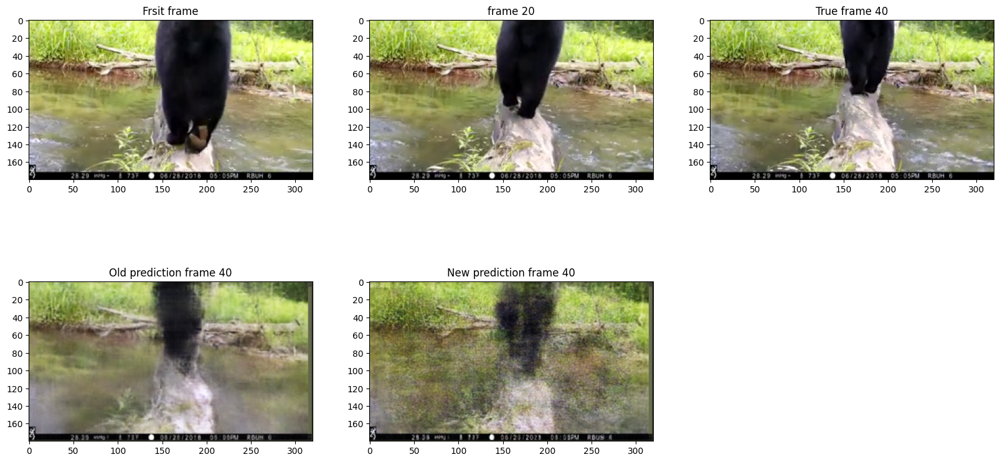

In [39]:
img1 = test[60][0].unsqueeze(0).to(device)
img2 = test[80][0].unsqueeze(0).to(device)
img3 = test[100][0].unsqueeze(0).to(device)

with torch.no_grad():
    enc1_new = model2.bottleneck(*model2.encode(img1))
    enc2_new = model2.bottleneck(*model2.encode(img2))

    linear_res_new = enc2_new + (enc2_new-enc1_new)
    img3_hat2 = model2.decode(linear_res_new)

plt.figure(figsize=(20,10))

ax = plt.subplot(2,3,1)
f.set_size_inches((30,20))
ax.imshow(img1.cpu().squeeze().numpy().transpose(1,2,0))
ax.set_title('Frsit frame')
ax = plt.subplot(2,3,2)
ax.imshow(img2.cpu().squeeze().numpy().transpose(1,2,0))
ax.set_title('frame 20')
ax = plt.subplot(2,3,3)
ax.imshow(img3.cpu().squeeze().numpy().transpose(1,2,0))
ax.set_title('True frame 40')
ax = plt.subplot(2,3,4)
ax.imshow(img3_hat.cpu().squeeze().numpy().transpose(1,2,0))
ax.set_title('Old prediction frame 40')
ax = plt.subplot(2,3,5)
ax.imshow(img3_hat2.cpu().squeeze().numpy().transpose(1,2,0))
ax.set_title('New prediction frame 40')

It's kind of a bust really - the bear isn't really worse or better than the old prediction, but i'd call the scene much worse - it has gotten grainy.  That's disappointing - perhaps the annotation training has introduced nonlinearities into the latent space and linear traversal is no longer valid.  I'll try another approach later...

## Grayscale
Can Grayscale do better?  It is, after all, reducing the information in the network by 2/3.  I went ahead and trained a grayscale model.  It uses the same architecture, just with the input and output channel number collapsed to one.

In [42]:
%%capture
cfg_file = "/scratch/ejg8qa/var-Next/configs/gs4096b20_d1_latent.json"
WEIGH = "../../vnext_results_annot/gs4096b20_d1_latent_beta_20/model_wts.pt"
with open(cfg_file,'r') as jfi:
    cfg = json.load(jfi)
gs4096 = varNext(cfg,device)
gs4096.load_state_dict(torch.load(WEIGH))
gs4096.to(device)
gs4096.eval()

trans = transforms.Compose([
                transforms.ToTensor(),
                transforms.Grayscale()])
test = ImageFolder(DATA_DIR,transform=trans)
val = ImageFolder('/scratch/ejg8qa/log_images_320/val',transform=trans)

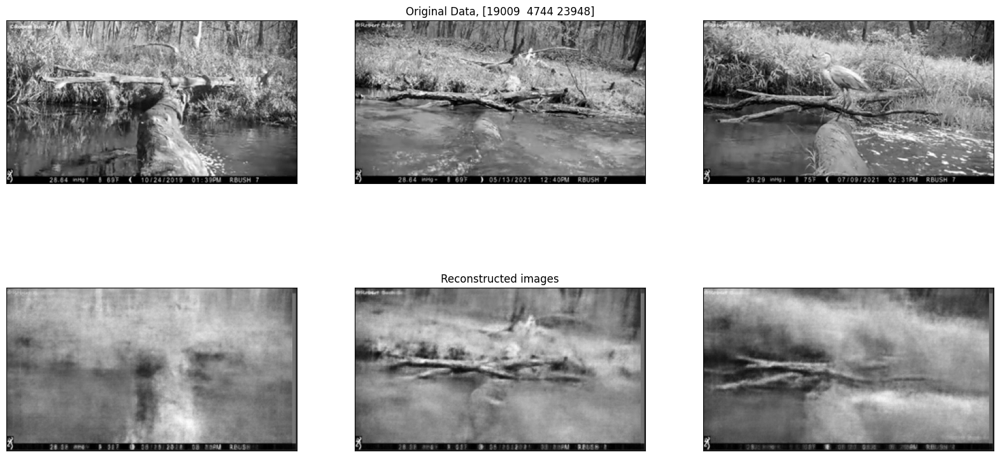

In [58]:
plot_ae_outputs(gs4096,val,n=3,gs=True)

Not what I expected - it does a lot worse.  I am not going to bother with this network; I tried again with a 5k latent space:

In [60]:
%%capture
cfg_file = "/scratch/ejg8qa/var-Next/configs/gs5k.json"
WEIGH = "../../vnext_results_annot/gs5k_beta_200/model_wts.pt"
with open(cfg_file,'r') as jfi:
    cfg = json.load(jfi)
gs5k = varNext(cfg,device)
gs5k.load_state_dict(torch.load(WEIGH))
gs5k.to(device)
gs5k.eval()

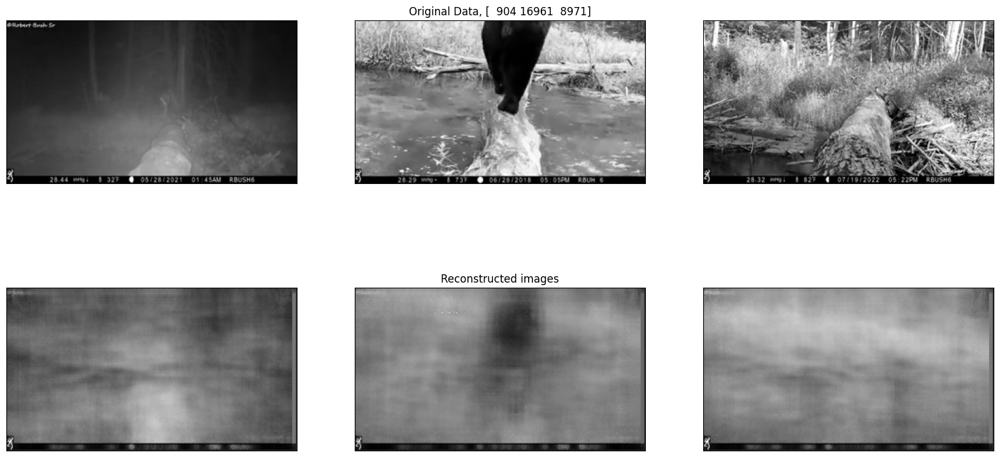

In [61]:
plot_ae_outputs(gs5k,val,n=3,gs=True)

These were leftover from my early attempts - the beta param is just way too high.  At the time of this writing a new version of the model is running but it may not make it into this paper.

## Fisher Geodesics
This is a long shot idea which occurred to me during homework 4.  Suppose that instead of traversing the latent space, we instead traverse the geodesic between the normal distribution parameters $\mu$ and $\sigma$ between two images.  If we continue along the geodesic for another step, can we achieve interpolation?

In [72]:
from scipy.optimize import fsolve
def sech(x):
    return 1/np.cosh(x)
    
def equations(x,u1,u2,s1,s2):
    '''
    fsolve needs a fourth parameter if you want to input 4 equations...
    Hopefully a dummy will do.
    
    '''
    t0 = -1
    t1 = 1
    return (x[0]*(np.sqrt(2)/2)*sech(x[2]*t0) - s1+x[3],
            x[0]*(np.sqrt(2)/2)*sech(x[2]*t1) - s2+x[3],
            x[0]*np.tanh(x[2]*t0)+x[1] - u1+ x[3],
            x[0]*np.tanh(x[2]*t1)+x[1] - u2 + x[3]
           )
def geod_params(u1,u2,s1,s2):
    
    a,b,c, d = fsolve(equations,(np.sqrt(2),0,0.6,0),(u1,u2,np.exp(s1),np.exp(s2)))
    return a,b,c,d

def advance_geodesic(a,b,c,d,t):
    u = a*np.tanh(c*t)+b+d
    s = a*(np.sqrt(2)/2)*sech(c*t)
    return u, s

In [73]:
with torch.no_grad():
    u1, s1 = model2.encode(img1)
    u2, s2 = model2.encode(img2)
id = 2
a, b, c,d = geod_params(u1[0,id].cpu().numpy(), u2[0,id].cpu().numpy(), s1[0,id].cpu().numpy(), s2[0,id].cpu().numpy())
print(advance_geodesic(a,b,c,d,-1))
print(advance_geodesic(a,b,c,d,1))

print(u1[0,id], u2[0,id], torch.exp(s1[0,id]), torch.exp(s2[0,id]))

(0.1433630381849994, -7.632561067489366e-06)
(-0.046491193809784837, -7.632561067489366e-06)
tensor(0.1433, device='cuda:0') tensor(-0.0465, device='cuda:0') tensor(0.8546, device='cuda:0') tensor(0.7292, device='cuda:0')


In [74]:
geod_params(-1,1,1,1)

(3.4922185945766175,
 -0.35231577710298034,
 0.2945866915866675,
 0.3523157771029803)

In [68]:
geod_params(-2,2,2,2)

(6.168382820881699,
 -3.2629837155769614,
 0.3363714001533645,
 3.2629837155769614)

Junk!  a,b,c are incorrect...  I had used Wolfram to solve this system of equations and got different answers - unfortunately I either have a bug in my code or (maybe more likely) fsolve is super sensitive to your choice of initial guesses.  It seems that it is going to take a lot more work to get a consistently numerically stable result that I can actually use to calculate these geodesics on the fly...  There's not much more I can do here for now.

Wolfram vs scipy...  I guess you get what you pay for!

## Conclusion
I really enjoyed this project, and it was pretty satisfying to see that motion interpolation was possible with this architecture.  I think some next steps could be
- Fix the fisher geodesic computation
- Train the VAE directly on next frames
    - Basically, double the channels on the network input to 6, stack two input images and target the desired next scene


## Appendix
### Fetching a subsection of an image
This is one of the challenges faced in the 'Training part 2' section - data comes out of our dataloader in tensors of [B x C x H x W] - how can we efficiently select a subsection of shape [B x (x1, y1, x2, y2)]?  If the section we wanted to select was the same across all images in the batch, this would be pretty easy - torch has many selection functions which can do this job for us.  But unfortunately for us, the position and shape of the bounding box we want to select changes in every sample in our batch!  I am in the habit of avoiding for loops in all torch code and so I was stuck on this problem for some time until I realized that I could use a mask, element wise multiply this with the full tensor of the batch of images, and use some form of MSE for the loss of the annotated section.

Since the annotations are variable size, I normalize the MSE by a factor of $\lambda = \frac{area_{image}}{area_{annotation}}$ to ensure that there is some kind of scaling for the annotation errors.  I then simply add this amount to the regular VAE loss function.

## Refrences
[1] Uniform Interpolation Constrained Geodesic 
Learnig on Data Manifold https://arxiv.org/pdf/2002.04829.pdf


[2] The Riemannian Geometry of Deep Generative Models ] https://arxiv.org/pdf/1711.08014.pon


[3] Github for this project ] https://github.com/sanyalsc/var-Next